In [1]:
import os
import glob as glob
import matplotlib.pyplot as plt
import cv2
import requests
import random
import numpy as np
import torch

np.random.seed(4)

In [2]:
TRAIN = False
# Number of epochs to train for.
EPOCHS = 20

In [3]:
class_names = ['Cat', 'Dog']
colors = np.random.uniform(0, 255, size=(len(class_names), 3))

In [4]:
# Function to convert bounding boxes in YOLO format to xmin, ymin, xmax, ymax.
def yolo2bbox(bboxes):
    xmin, ymin = bboxes[0]-bboxes[2]/2, bboxes[1]-bboxes[3]/2
    xmax, ymax = bboxes[0]+bboxes[2]/2, bboxes[1]+bboxes[3]/2
    return xmin, ymin, xmax, ymax

In [5]:
def plot_box(image, bboxes, labels):
    # Need the image height and width to denormalize
    # the bounding box coordinates
    h, w, _ = image.shape
    for box_num, box in enumerate(bboxes):
        x1, y1, x2, y2 = yolo2bbox(box)
        # denormalize the coordinates
        xmin = int(x1*w)
        ymin = int(y1*h)
        xmax = int(x2*w)
        ymax = int(y2*h)
        width = xmax - xmin
        height = ymax - ymin
        
        class_name = class_names[int(labels[box_num])]
        
        cv2.rectangle(
            image, 
            (xmin, ymin), (xmax, ymax),
            color=colors[class_names.index(class_name)],
            thickness=2
        ) 

        font_scale = min(1,max(3,int(w/500)))
        font_thickness = min(2, max(10,int(w/50)))
        
        p1, p2 = (int(xmin), int(ymin)), (int(xmax), int(ymax))
        # Text width and height
        tw, th = cv2.getTextSize(
            class_name, 
            0, fontScale=font_scale, thickness=font_thickness
        )[0]
        p2 = p1[0] + tw, p1[1] + -th - 10
        cv2.rectangle(
            image, 
            p1, p2,
            color=colors[class_names.index(class_name)],
            thickness=-1,
        )
        cv2.putText(
            image, 
            class_name,
            (xmin+1, ymin-10),
            cv2.FONT_HERSHEY_SIMPLEX,
            font_scale,
            (255, 255, 255),
            font_thickness
        )
    return image

In [6]:
# Function to plot images with the bounding boxes.
def plot(image_paths, label_paths, num_samples):
    all_training_images = glob.glob(image_paths)
    all_training_labels = glob.glob(label_paths)
    all_training_images.sort()
    all_training_labels.sort()
    
    num_images = len(all_training_images)
    
    plt.figure(figsize=(15, 12))
    for i in range(num_samples):
        j = random.randint(0,num_images-1)
        image = cv2.imread(all_training_images[j])
        with open(all_training_labels[j], 'r') as f:
            bboxes = []
            labels = []
            label_lines = f.readlines()
            for label_line in label_lines:
                label = label_line[0]
                bbox_string = label_line[2:]
                x_c, y_c, w, h = bbox_string.split(' ')
                x_c = float(x_c)
                y_c = float(y_c)
                w = float(w)
                h = float(h)
                bboxes.append([x_c, y_c, w, h])
                labels.append(label)
        result_image = plot_box(image, bboxes, labels)
        plt.subplot(2, 2, i+1)
        plt.imshow(result_image[:, :, ::-1])
        plt.axis('off')
    plt.subplots_adjust(wspace=0)
    plt.tight_layout()
    plt.show()

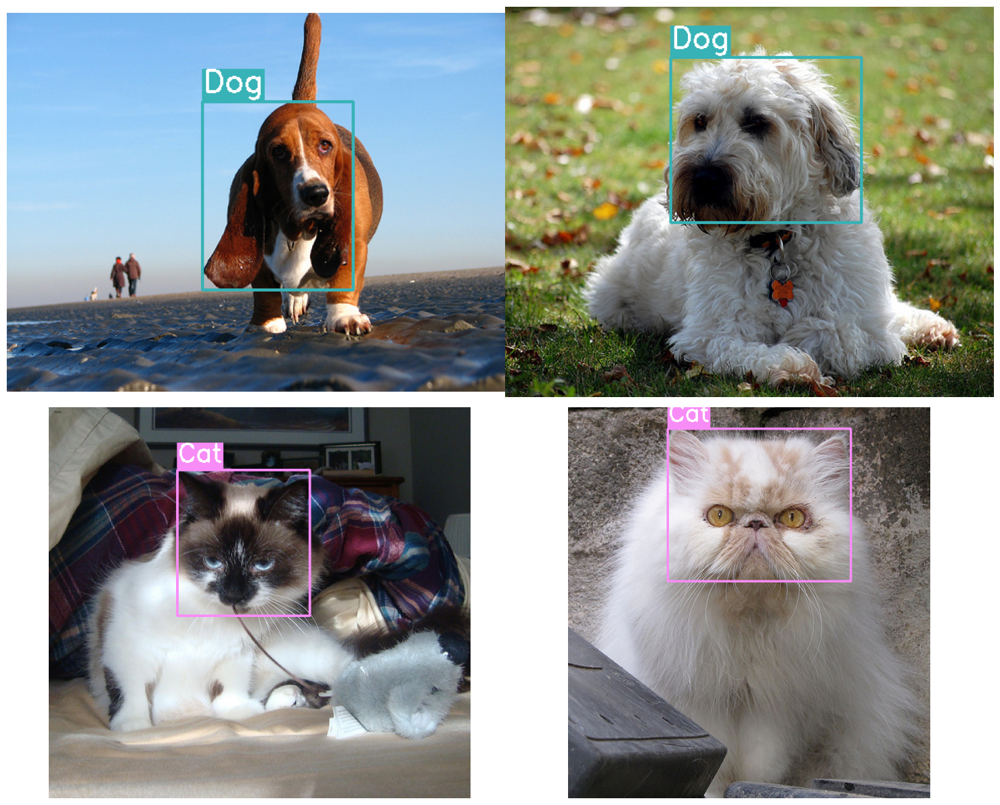

In [7]:
# Visualize a few training images.

plot(
    image_paths='dataset/train/images/*.png', 
    label_paths='dataset/train/labels/*.txt',
    num_samples=4,
)


In [7]:
def set_result_dir():
    # Directory to store results
    result_dir_count = len(glob.glob('runs/train/*'))
    print(f"Current number of result directories: {result_dir_count}")
    if TRAIN:
        RES_DIR = f"results_{result_dir_count+1}"
        print(RES_DIR)
    else:
        RES_DIR = f"results_{result_dir_count}"
    return RES_DIR

In [9]:
# Function to show validation predictions saved during training.
def show_valid_results(RES_DIR):
    !ls runs/train/{RES_DIR}
    EXP_PATH = f"runs/train/{RES_DIR}"
    validation_pred_images = glob.glob(f"{EXP_PATH}/*_pred.jpg")
    print(validation_pred_images)
    for pred_image in validation_pred_images:
        image = cv2.imread(pred_image)
        plt.figure(figsize=(19, 16))
        plt.imshow(image[:, :, ::-1])
        plt.axis('off')
        plt.show()

In [8]:
# Helper function for inference on images.
def inference(RES_DIR, data_path):
    # Directory to store inference results.
    infer_dir_count = len(glob.glob('runs/detect/*'))
    print(f"Current number of inference detection directories: {infer_dir_count}")
    INFER_DIR = f"Predicted_{infer_dir_count+1}"
    print(INFER_DIR)
    # Inference on images.
    !python detect.py --weights runs/train/{RES_DIR}/weights/best.pt \
    --source {data_path} --name {INFER_DIR}
    return INFER_DIR

In [9]:
def visualize(INFER_DIR):
# Visualize inference images.
    INFER_PATH = f"runs/detect/{INFER_DIR}"
    infer_images = glob.glob(f"{INFER_PATH}/*")
    print(infer_images)
    for pred_image in infer_images:
        image = cv2.imread(pred_image)
        plt.figure(figsize=(19, 16))
        plt.imshow(image[:, :, ::-1])
        plt.axis('off')
        plt.show()

In [12]:
##Clone YOLOV5 Repository

In [13]:
if not os.path.exists('yolov5'):
    !git clone https://github.com/ultralytics/yolov5.git

In [14]:
%cd yolov5/
!pwd

/Users/sabuj./Desktop/CloundComputing/yolov5
/Users/sabuj./Desktop/CloundComputing/yolov5


In [15]:
!pip install -r requirements.txt

In [16]:
RESULT_DIR = set_result_dir()
if TRAIN:
    !python train.py --data ../data.yaml --weights yolov5m.pt \
    --img 352 --epochs {EPOCHS} --batch-size 16 --name {RESULT_DIR}

Current number of result directories: 0
results_1
train: weights=yolov5m.pt, cfg=, data=../data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=20, batch_size=16, imgsz=352, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=None, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=results_1, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
requirements: /Users/sabuj./Desktop/CloundComputing/requirements.txt not found, check failed.
YOLOv5 🚀 v7.0-162-gc3e4e94 Python-3.10.9 torch-2.0.0 CPU

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.


      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
       9/19         0G    0.02284   0.009547   0.002771         36        352: 1
                 Class     Images  Instances          P          R      mAP50   
                   all        390        390       0.99      0.979      0.992      0.815

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
      10/19         0G    0.02177   0.009187   0.002879         31        352: 1
                 Class     Images  Instances          P          R      mAP50   
                   all        390        390      0.976      0.983      0.994      0.817

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
      11/19         0G    0.02076   0.008932     0.0025         32        352: 1
                 Class     Images  Instances          P          R      mAP50   
                   all        390        390      0.993      0.985      0.994      0.847

      Epo

In [10]:

%cd yolov5/
!pwd
RESULT_DIR = set_result_dir()
RESULT_DIR

/Users/sabuj./Desktop/CloundComputing/yolov5
/Users/sabuj./Desktop/CloundComputing/yolov5
Current number of result directories: 1


'results_1'

In [11]:
IMAGE_INFER_DIR = inference(RESULT_DIR, 'Prediction_image')
IMAGE_INFER_DIR

Current number of inference detection directories: 1
Predicted_2
detect: weights=['runs/train/results_1/weights/best.pt'], source=Prediction_image, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=Predicted_2, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
requirements: /Users/sabuj./Desktop/CloundComputing/requirements.txt not found, check failed.
YOLOv5 🚀 v7.0-162-gc3e4e94 Python-3.10.9 torch-2.0.0 CPU

Fusing layers... 
Model summary: 212 layers, 20856975 parameters, 0 gradients, 47.9 GFLOPs
image 1/1 /Users/sabuj./Desktop/CloundComputing/yolov5/Prediction_image/test1111.jpg: 576x640 1 Cat, 185.8ms
Speed: 1.3ms pre-process, 185.8ms inference, 6.4ms NMS per image at shape (1, 3, 640, 640)
Result

'Predicted_2'

['runs/detect/Predicted_2/download.jpeg', 'runs/detect/Predicted_2/cat.jpg', 'runs/detect/Predicted_2/d.jpg', 'runs/detect/Predicted_2/ca.jpg']


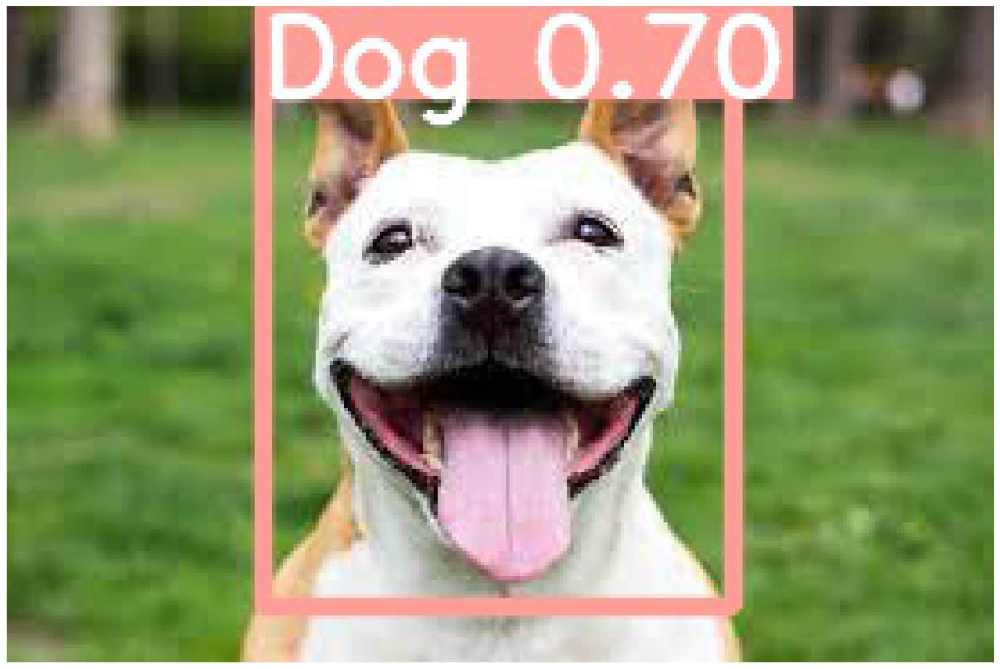

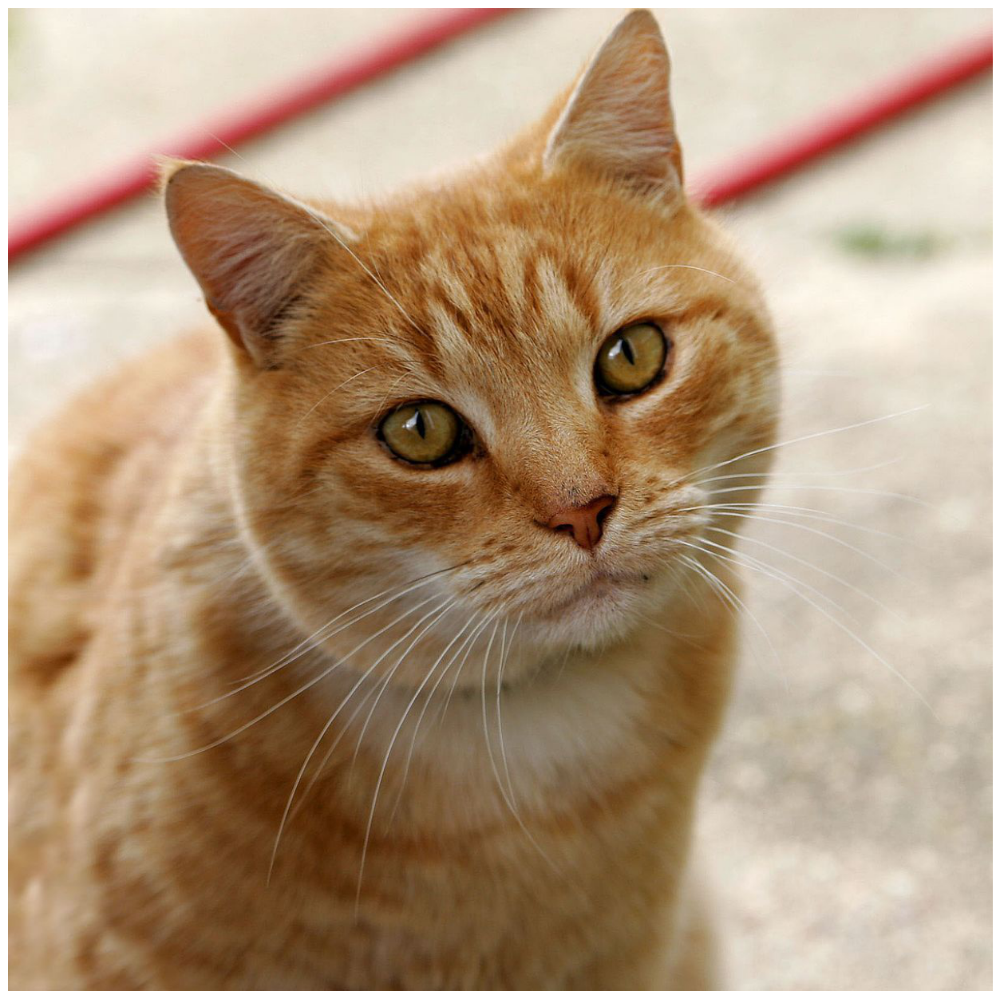

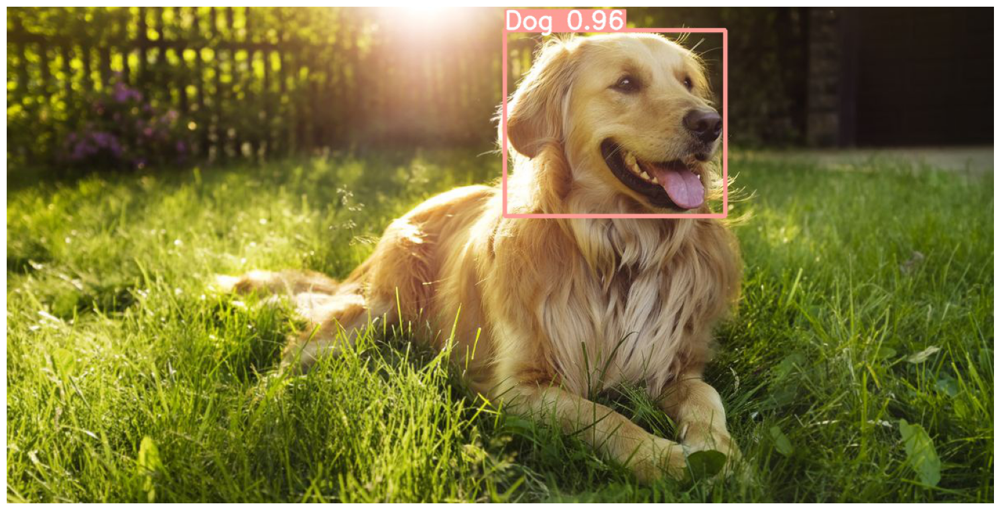

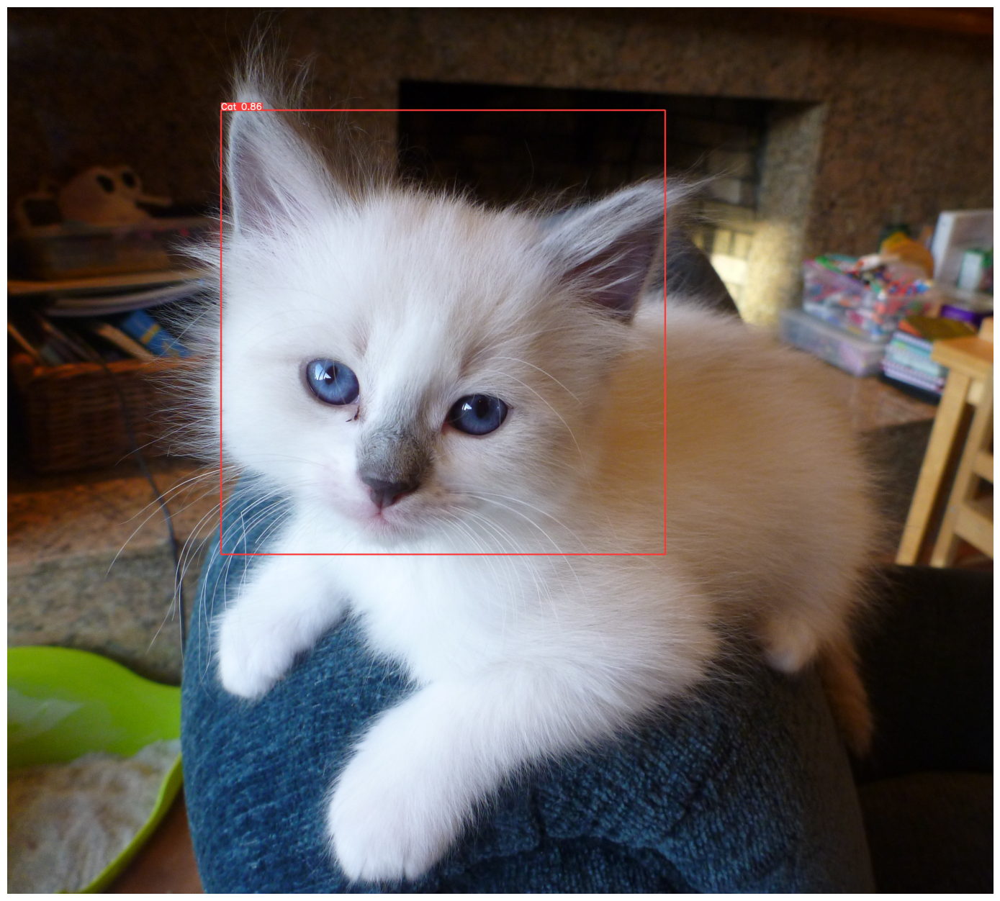

In [22]:
visualize(IMAGE_INFER_DIR)